## 2-1

In [1]:
# 사용하기 위한 라이브러리와 모듈 불러오기

import os # 파일, 디렉토리 작업 때 사용하는 모듈
import torch # pytorch 사용하기 위한 모듈
import random # 랜덤 모듈, 랜덤 값을 생성할 때 사용하는 모듈
import torchvision # 컴비터 비전 관련 모듈
import torchvision.transforms as transforms # 데이터 전처리 관련 모듈
# 데이터 로딩을 위한 dataloader,학습에서 특정 클래스나 데이터만을 사용해야 할 때, 사용하는 라이브러리
from torch.utils.data import DataLoader, Subset

import torch.nn as nn # 레이어 정의
import torch.optim as optim # 최적화 모듈
import torch.nn.functional as F # activation 모듈
from tqdm import tqdm # 진행사항 표시 모듈
from collections import Counter # 클래스별로 몇 개의 샘플이 있는지 카운팅 하기 위한 모듈

from sklearn.manifold import TSNE # 차원 축소 기법 tsne 사용하기 위한 모듈
from matplotlib.colors import ListedColormap # 색상 리스트를 부르기 위한 모듈
import matplotlib.pyplot as plt # 데이터 시각화, 그래프 그리는 모듈
import numpy as np # numpy 라이브러리

In [2]:
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # 여러 GPU를 사용하는 경우
    torch.backends.cudnn.deterministic = True  # CUDNN 비결정적 연산 방지
    torch.backends.cudnn.benchmark = False

# Seed 고정
set_seed(777)

In [3]:
class ResnetBlock(nn.Module):
    def __init__(self, input_c, output_c, stride = 1):
        # resnetblock 함수
        # input_c = 입력 채널, output_c = 출력 채널, stride = stride 크기
        super(ResnetBlock, self).__init__()
        
        # 첫 번째 convolution layer = 3 x 3 커널, padding = 1을 이용해서 입력과 동일한 크기 출력을 만듦
        self.conv1 = nn.Conv2d(input_c, output_c, kernel_size = 3, stride = stride, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(output_c)
        
        # 두 번째 convolution layer = 3 x 3 커널, padding = 1을 이용해서 입력과 동일한 크기 출력을 만듦
        self.conv2 = nn.Conv2d(output_c, output_c, kernel_size = 3, stride = 1, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(output_c)
        
        # skip connection
        # 입력과 출력의 차원이 다르거나 stride가 1이 아닐 때, skip connection 추가
        self.skip = nn.Sequential()
        if stride != 1 or input_c != output_c:
            # 입력의 차원을 맞추기 위해 1 x 1 conv layer 사용
            self.skip = nn.Sequential(
                nn.Conv2d(input_c, output_c, kernel_size = 1, stride = stride, bias = False),
                nn.BatchNorm2d(output_c)
            )
            
    def forward(self, x):
        # relu
        output = F.relu(self.bn1(self.conv1(x)))
        
        # batchnorm
        output = self.bn2(self.conv2(output))
        
        # skip connection
        output += self.skip(x)
        
        # relu
        output = F.relu(output)
        
        return output

In [4]:
class Resnet(nn.Module):
    def __init__(self, block, num_blocks, num_classes = 10):
        # block = resnet 블록, num_blocks = 각 layer에서 사용할 블럭의 수, num_classes = cifar10  클래스 수
        super(Resnet, self).__init__()
        # 입력 채널 수
        self.input_c = 64
        
        # 첫 번째 convolution layer = 3 x 3 커널, 입력 채널은 cifar10이 rgb 이미지 이므로 3, 출력은 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size = 3, stride = 1, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(64)
        
        # 각 레이어를 만들기 위한 블록 구성
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride = 1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride = 2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride = 2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride = 2)
        
        self.linear = nn.Linear(512, num_classes)
        
    def _make_layer(self, block, output_c, num_blocks, stride):
        # 레이어를 구성하는 함수
        # block = 사용할 블록, output_c = 출력 채널, num_blocks = 레이어에서 사용할 블록 수
        strides = [stride] + [1] * (num_blocks - 1)
        layers = []
        for stride in strides:
            # resnet 블록 추가하고 입력 채널 수를 업데이트
            layers.append(block(self.input_c, output_c, stride))
            # 다음 블록의 입력 채널 수는 현재 출력 채널 수와 동일
            self.input_c = output_c
            
        # 레이어를 순차적으로 변환
        return nn.Sequential(*layers)
    
    def forward(self, x):
        # 순전파
        # relu
        output = F.relu(self.bn1(self.conv1(x)))
        
        # 각 레이어를 차례대로 통과 --> 연결된 블록들
        output = self.layer1(output)
        output = self.layer2(output)
        output = self.layer3(output)
        output = self.layer4(output)
        
        # average pooling = 출력 텐서 크기를 줄임 (4 x 4)
        output = F.avg_pool2d(output, 4)
        
        # 출력을 1차원 벡터로 변환
        output = output.view(output.size(0), -1)
    
        output = self.linear(output)
        
        return output

In [5]:
def ResNet18():
    # resnet18 모델을 생성하는 함수
    # resnet18 구조는 4개의 layer 그룹으로 되어 있는데, 각 그룹은 2개의 resnetblock을 포함
    
    # resnet 클래스를 호출해서 resnet18 모델을 만들고 반환
    # resnetblock = resnet 블록 구조를 정의하는 클래스
    # [2, 2, 2, 2] = 각 layer 그룹에서 사용할 resnetblock의 수
    return Resnet(ResnetBlock, [2, 2, 2, 2])

In [6]:
# data augmentation
train_transform = transforms.Compose([
    # 이미지를 tensor로 변환, 이미지 값이 0~1 사이로 스케일링
    transforms.ToTensor(),
    # 이미지의 RGB 채널 값을 평균, 표준편차로 정규화
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [7]:
# cifar10 데이터 다운로드

train_dataset = torchvision.datasets.CIFAR10(root = './Boundary_Unlearning_task_data', train = True, download = True, transform = train_transform)
test_dataset = torchvision.datasets.CIFAR10(root = './Boundary_Unlearning_task_data', train = False, download = True, transform = test_transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size = 64, shuffle = True, num_workers = 4)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size = 64, shuffle = False, num_workers = 4)

Files already downloaded and verified
Files already downloaded and verified


In [8]:
len(train_dataset), len(test_dataset)

(50000, 10000)

In [9]:
# gpu가 사용 가능한지 확인 --> 가능하면 첫 번째 gpu를 사용하고 아니면 cpu 사용
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=2)

In [10]:
# 데이터셋에서 정답을 랜덤하게 변경하는 함수
def random_labels(dataset, num_classes = 10):
    random_dataset = []
    
    for i in range(len(dataset)):
        # i 번째, 샘플의 이미지, 정답을 가져옴 
        dataset_images, dataset_labels = dataset[i]
        # 0~9까지 정답을 생성, 현재 샘픔의 정답과 다른 숫자를 가져옴.
        # ex) 원래 정답이 3이면, 3을 제외한 [0, 1, 2, 4, 5, 6, 7, 8, 9]
        remain_labels = [label for label in range(num_classes) if label != dataset_labels]
        # 남은 [0, 1, 2, 4, 5, 6, 7, 8, 9]에서 임의로 하나 선택
        random_labels = random.choice(remain_labels)
        # 이미지와 좀 전에 임의로 선택된 숫자를 함께 저장
        random_dataset.append((dataset_images, random_labels))
        
    return random_dataset

In [11]:
# 잊고자 하는 클래스
forget_class = 0

# forget class에 해당하는 인덱스 저장 --> 클래스 0에 해당하는 데이터 인덱스만 리스트에 저장
train_forgetset_split = [i for i, (_, label) in enumerate(train_dataset) if label == forget_class]
# forget class에 해당하지 않는 인덱스 저장 --> 클래스 0을 제외한 데이터 인덱스만 레스트에 저장
train_remainset_split = [i for i, (_, label) in enumerate(train_dataset) if label != forget_class]

In [12]:
# forget class에 해당하는 인덱스 저장 --> 클래스 0에 해당하는 데이터 인덱스만 리스트에 저장
test_forgetset_split = [i for i, (_, label) in enumerate(test_dataset) if label == forget_class]
# forget class에 해당하지 않는 인덱스 저장 --> 클래스 0을 제외한 데이터 인덱스만 레스트에 저장
test_remainset_split = [i for i, (_, label) in enumerate(test_dataset) if label != forget_class]

In [13]:
# 학습 중 잊어야 하는 데이터만 추출한 데이터셋
train_forgetset = Subset(train_dataset, train_forgetset_split)
# 학습 중 잊어야 하는 데이터를 제외한 데이터셋
train_remainset = Subset(train_dataset, train_remainset_split)
# 테스트 중 잊어야 하는 데이터만 추출한 데이터셋
test_forgetset = Subset(test_dataset, test_forgetset_split)
# 테스트 중 잊어야 하는 데이터를 제외한 데이터셋
test_remainset = Subset(test_dataset, test_remainset_split)

In [14]:
len(train_forgetset), len(train_remainset), len(test_forgetset), len(test_remainset)

(5000, 45000, 1000, 9000)

In [15]:
train_forgetset[0][1]

0

In [16]:
# random labels 적용
train_forgetset = random_labels(train_forgetset)
test_forgetset = random_labels(test_forgetset)

In [17]:
# 클래스별 수를 확인하기 위한 함수
def count_label(dataset):
    labels = [label for _, label in dataset]
    
    label_count = Counter(labels)
    
    return label_count

In [18]:
train_forgetset_count = count_label(train_forgetset) 
test_forgetset_count = count_label(test_forgetset) 
print('train_count_label : ', train_forgetset_count)
print('test_count_label : ', test_forgetset_count)

train_count_label :  Counter({3: 576, 2: 573, 1: 572, 6: 562, 4: 560, 7: 553, 9: 548, 8: 531, 5: 525})
test_count_label :  Counter({4: 121, 6: 120, 5: 114, 7: 114, 8: 114, 2: 107, 3: 106, 1: 105, 9: 99})


In [19]:
len(train_forgetset)

5000

In [20]:
train_forgetset[0][1]

4

In [21]:
train_remain_loader = DataLoader(train_remainset, batch_size = 64, shuffle = True)
train_forget_loader = DataLoader(train_forgetset, batch_size = 64, shuffle = True)
test_remain_loader = DataLoader(test_remainset, batch_size = 64, shuffle = False)
test_forget_loader = DataLoader(test_forgetset, batch_size = 64, shuffle = False)

In [22]:
def extract_emb(model, dataloader, device):
    # 모델을 평가모드로 설정 --> 학습 중에 발생하는 것 비활성화 ex) batch normalization
    model.eval()
    emb = []
    all_label = []
    
    # 모델이 가중치를 업데이트 하지 않도록 설정
    with torch.no_grad():
        for batch_images, batch_labels in dataloader:
            # 데이터와 정답 정보들을 정한 device로 이동 --> cpu or gpu
            batch_images, batch_labels = batch_images.to(device), batch_labels.to(device)
            
            # 모델을 통해서 결과값 추출
            features = model(batch_images)
            
            # 결과값 저장
            emb.append(features.cpu().numpy())
            all_label.append(batch_labels.cpu().numpy())
            
    # 모든 배치의 데이터를 연결해서 numpy 배열로 변환
    emb = np.concatenate(emb)
    all_label = np.concatenate(all_label)
    
    return emb, all_label

In [23]:
def visualization_emb_random_labels_remain(embs, labels):
    # tsne를 사용해서 2차원으로 데이터 차원 축소
    tsne = TSNE(n_components = 2, random_state = 7777)
    
    # 추출한 feature embedding을 차원 축소
    reduced_data = tsne.fit_transform(embs)
    
    # 9개의 클래스를 시각화하기 위해 tab10 컬러맵의 9개만 사용
    cmap = ListedColormap(plt.cm.tab10.colors[:9])
    
    # 그래프 크기
    plt.figure(figsize=(16, 12))
    
    # 축소한 데이터를 2차원으로 시각화 --> 점으로 시각화
    scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c = labels, cmap = cmap, alpha = 0.4)

    plt.legend(loc = 'lower right')
    plt.axis('off')
    # plt.colorbar(scatter)
    plt.title('cifar10_using_9_classes_remain_labels')
    plt.show()

In [24]:
def visualization_emb_random_labels_forget(embs, labels):
    # tsne를 사용해서 2차원으로 데이터 차원 축소
    tsne = TSNE(n_components = 2, random_state = 7777)
    
    # 추출한 feature embedding을 차원 축소
    reduced_data = tsne.fit_transform(embs)
    
    # 9개의 클래스를 시각화하기 위해 tab10 컬러맵의 9개만 사용
    cmap = ListedColormap(plt.cm.tab10.colors[9:])

    # 중복 제거 후 리스트로 변경    
    classes = list(set(labels))
    
    # 그래프 크기
    plt.figure(figsize=(16, 12))
    
    # 랜덤 정답으로 선정된 각 클래스에 대해 반복
    for i in classes:
        scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c = labels, cmap = cmap, label = f'class {i}', alpha = 0.4)
    
    plt.legend(loc = 'lower right')
    plt.axis('off')
    # plt.colorbar(scatter)
    plt.title('cifar10_using_9_classes_random_labels')
    plt.show()

In [25]:
# remain 데이터와 forget 데이터에 대해 시각화 하는 함수
# emb_remain = 남은 데이터
# emb_forget = 잊을 데이터
# remain_labels = 남은 데이터에 맞는 정답
# forget_labels = 잊을 데이터에 맞는 정답

def visualization_emb_com(emb_remain, emb_forget, remain_labels, forget_labels):
    # 남은 데이터와 잊을 데이터를 행 방향으로 합쳐서 배열을 만듦
    comb_emb = np.concatenate([emb_remain, emb_forget], axis = 0)
    comb_label = np.concatenate([remain_labels, forget_labels], axis = 0)
    
    # tsne를 사용해서 2차원으로 데이터 차원 축소
    tsne = TSNE(n_components = 2, random_state = 7777)
    
    # 추출한 feature embedding을 차원 축소
    reduced_data = tsne.fit_transform(comb_emb)
    
    # 남은 데이터는 tab10의 색상 중 9개만 사용
    cmap1 = ListedColormap(plt.cm.tab10.colors[:9])
    # 잊을 데이터는 그 이외의 색상을 사용
    cmap2 = ListedColormap(plt.cm.tab10.colors[9:])
    
    # 그래프 크기
    plt.figure(figsize=(16, 12))
    
    # 축소한 데이터를 2차원으로 시각화 --> 점으로 시각화
    remain_scatter = plt.scatter(reduced_data[:len(emb_remain), 0], reduced_data[:len(emb_remain), 1], c = remain_labels, 
                                 cmap = cmap1, alpha = 0.4, label = 'remain', marker = 'o')
    forget_scatter = plt.scatter(reduced_data[len(emb_remain):, 0], reduced_data[len(emb_remain):, 1], c = forget_labels, 
                                 cmap = cmap2, alpha = 0.8, label = 'forget', marker = 'x')
    # scatter = plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c = comb_label, cmap = 'tab10', alpha = 0.6)
    
    plt.legend()
    plt.axis('off')
    # plt.colorbar(remain_scatter)
    # plt.colorbar(forget_scatter)
    # plt.colorbar(scatter, ticks = range(10))
    plt.title('cifar10_using_random_labels_remain_forget_decision_space')
    plt.show()

start training epoch  1


100%|██████████| 141/141 [00:05<00:00, 23.97it/s]


[epoch][1 / 30], train_loss : 1.5950, train_accuracy : 41.2133, test_loss : 1.2826, test_accuracy : 51.7222%
new acc : 51.72%, save model !
visualization decision space 1


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


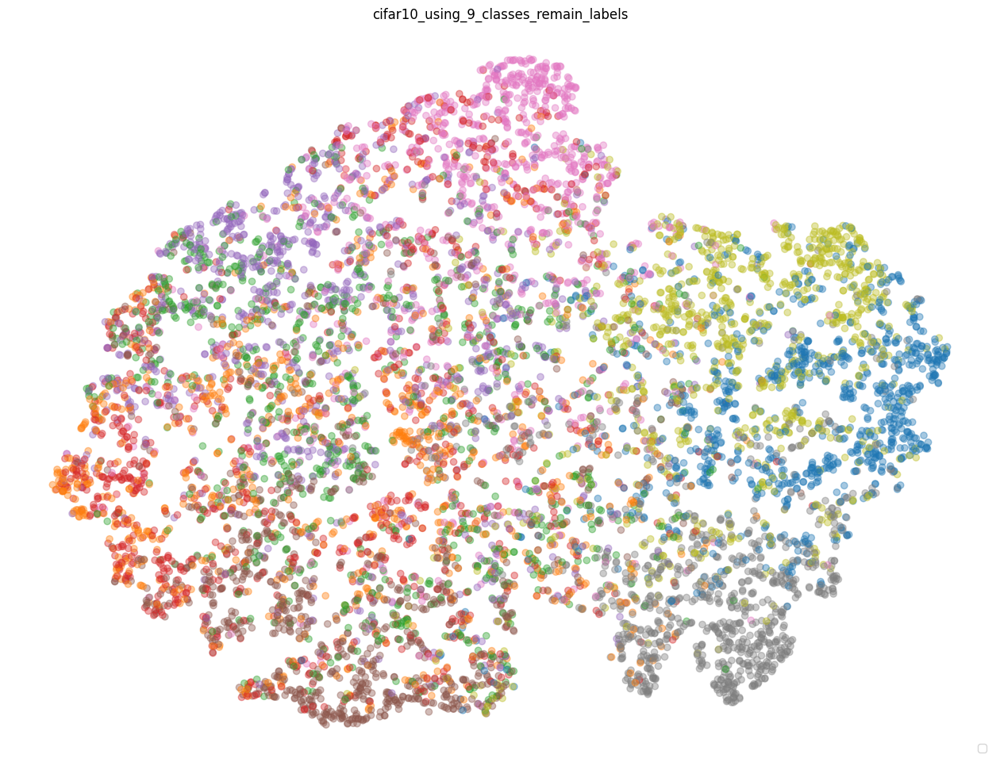

start training epoch  2


100%|██████████| 141/141 [00:05<00:00, 26.87it/s]


[epoch][2 / 30], train_loss : 1.1118, train_accuracy : 59.4067, test_loss : 1.0915, test_accuracy : 61.6333%
new acc : 61.63%, save model !
start training epoch  3


100%|██████████| 141/141 [00:05<00:00, 23.93it/s]


[epoch][3 / 30], train_loss : 0.8371, train_accuracy : 70.0956, test_loss : 0.8332, test_accuracy : 70.4444%
new acc : 70.44%, save model !
start training epoch  4


100%|██████████| 141/141 [00:05<00:00, 23.89it/s]


[epoch][4 / 30], train_loss : 0.6704, train_accuracy : 76.0667, test_loss : 0.8089, test_accuracy : 73.4667%
new acc : 73.47%, save model !
start training epoch  5


100%|██████████| 141/141 [00:05<00:00, 24.04it/s]


[epoch][5 / 30], train_loss : 0.5426, train_accuracy : 80.8911, test_loss : 0.6452, test_accuracy : 77.6333%
new acc : 77.63%, save model !
visualization decision space 5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


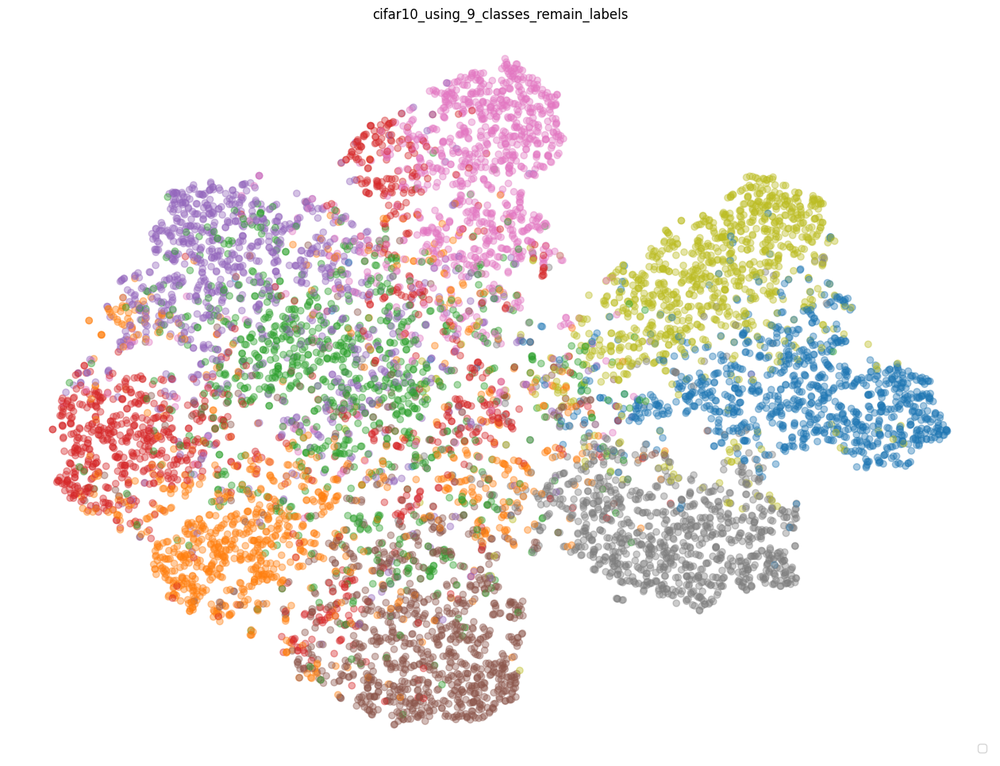

start training epoch  6


100%|██████████| 141/141 [00:05<00:00, 24.00it/s]


[epoch][6 / 30], train_loss : 0.4272, train_accuracy : 85.0756, test_loss : 0.6031, test_accuracy : 79.8222%
new acc : 79.82%, save model !
start training epoch  7


100%|██████████| 141/141 [00:05<00:00, 23.85it/s]


[epoch][7 / 30], train_loss : 0.3570, train_accuracy : 87.5200, test_loss : 0.6249, test_accuracy : 79.8222%
start training epoch  8


100%|██████████| 141/141 [00:05<00:00, 23.87it/s]


[epoch][8 / 30], train_loss : 0.2590, train_accuracy : 90.8867, test_loss : 0.7300, test_accuracy : 79.2000%
start training epoch  9


100%|██████████| 141/141 [00:06<00:00, 23.44it/s]


[epoch][9 / 30], train_loss : 0.2309, train_accuracy : 91.9222, test_loss : 0.6524, test_accuracy : 81.2222%
new acc : 81.22%, save model !
start training epoch  10


100%|██████████| 141/141 [00:05<00:00, 23.63it/s]


[epoch][10 / 30], train_loss : 0.1559, train_accuracy : 94.5444, test_loss : 0.7008, test_accuracy : 81.9000%
new acc : 81.90%, save model !
visualization decision space 10


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


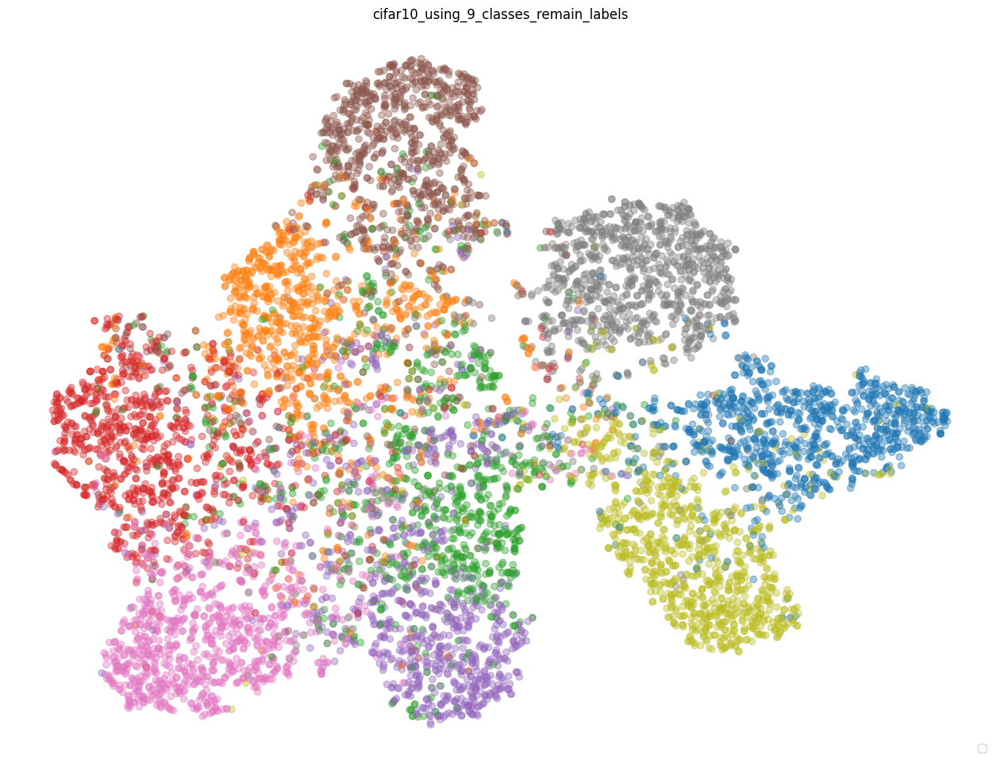

start training epoch  11


100%|██████████| 141/141 [00:05<00:00, 23.50it/s]


[epoch][11 / 30], train_loss : 0.1055, train_accuracy : 96.1667, test_loss : 0.7257, test_accuracy : 82.3778%
new acc : 82.38%, save model !
start training epoch  12


100%|██████████| 141/141 [00:06<00:00, 22.25it/s]


[epoch][12 / 30], train_loss : 0.0832, train_accuracy : 97.1311, test_loss : 0.8755, test_accuracy : 80.9444%
start training epoch  13


100%|██████████| 141/141 [00:05<00:00, 23.76it/s]


[epoch][13 / 30], train_loss : 0.0609, train_accuracy : 97.8778, test_loss : 0.8109, test_accuracy : 82.4111%
new acc : 82.41%, save model !
start training epoch  14


100%|██████████| 141/141 [00:05<00:00, 23.68it/s]


[epoch][14 / 30], train_loss : 0.0605, train_accuracy : 97.9156, test_loss : 0.8529, test_accuracy : 83.5111%
new acc : 83.51%, save model !
start training epoch  15


100%|██████████| 141/141 [00:06<00:00, 21.86it/s]


[epoch][15 / 30], train_loss : 0.0483, train_accuracy : 98.3733, test_loss : 0.8588, test_accuracy : 83.4333%
visualization decision space 15


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


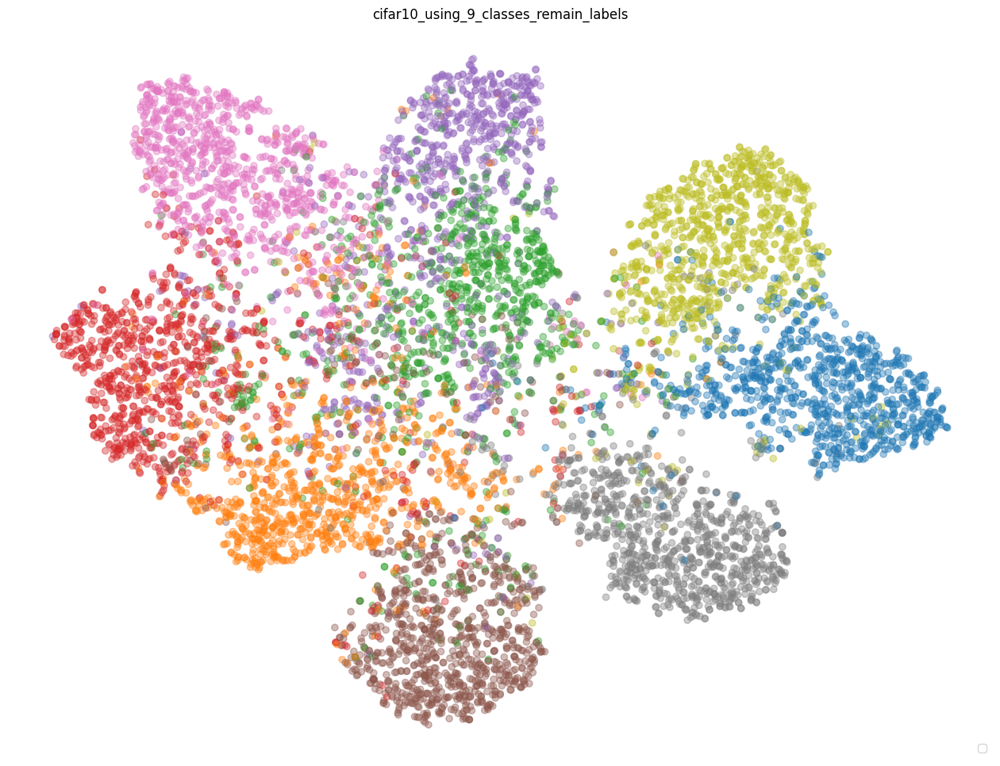

start training epoch  16


100%|██████████| 141/141 [00:05<00:00, 24.43it/s]


[epoch][16 / 30], train_loss : 0.0448, train_accuracy : 98.5000, test_loss : 0.9142, test_accuracy : 83.1778%
start training epoch  17


100%|██████████| 141/141 [00:05<00:00, 23.71it/s]


[epoch][17 / 30], train_loss : 0.0331, train_accuracy : 98.9933, test_loss : 0.8109, test_accuracy : 83.7444%
new acc : 83.74%, save model !
start training epoch  18


100%|██████████| 141/141 [00:05<00:00, 23.80it/s]


[epoch][18 / 30], train_loss : 0.0371, train_accuracy : 98.7422, test_loss : 0.9149, test_accuracy : 82.5444%
start training epoch  19


100%|██████████| 141/141 [00:05<00:00, 23.88it/s]


[epoch][19 / 30], train_loss : 0.0397, train_accuracy : 98.7067, test_loss : 0.8931, test_accuracy : 83.4000%
start training epoch  20


100%|██████████| 141/141 [00:05<00:00, 23.76it/s]


[epoch][20 / 30], train_loss : 0.0166, train_accuracy : 99.4622, test_loss : 0.9745, test_accuracy : 83.6889%
visualization decision space 20


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


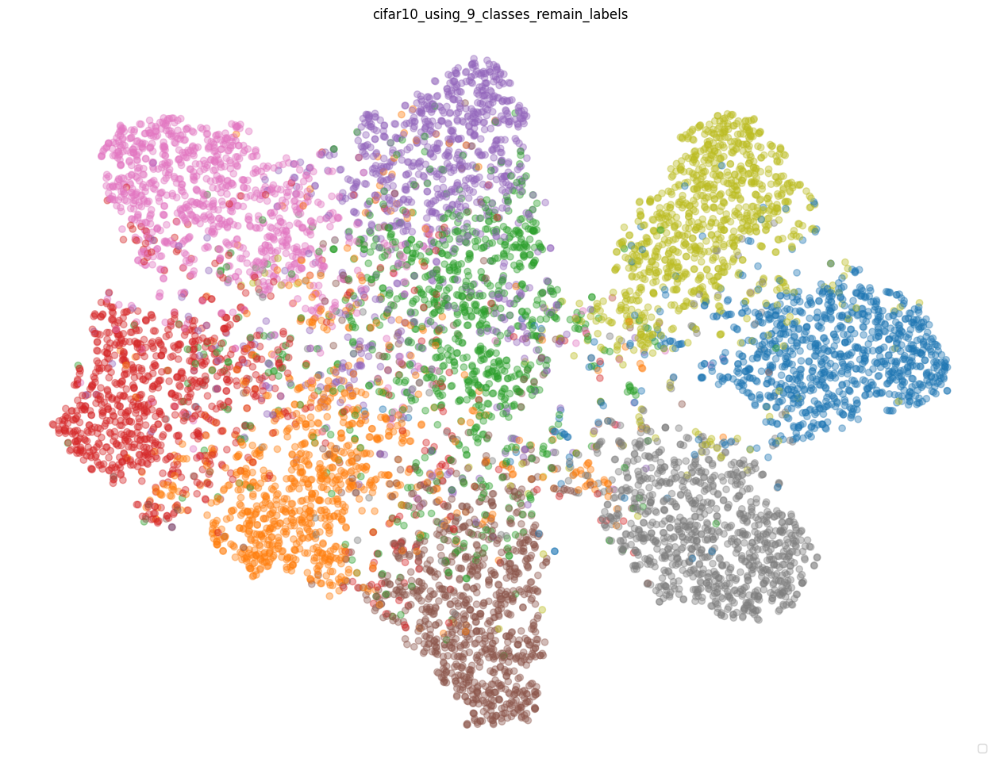

start training epoch  21


100%|██████████| 141/141 [00:05<00:00, 23.94it/s]


[epoch][21 / 30], train_loss : 0.0126, train_accuracy : 99.5800, test_loss : 0.9715, test_accuracy : 84.0556%
new acc : 84.06%, save model !
start training epoch  22


100%|██████████| 141/141 [00:05<00:00, 23.88it/s]


[epoch][22 / 30], train_loss : 0.0128, train_accuracy : 99.5644, test_loss : 0.9761, test_accuracy : 84.6556%
new acc : 84.66%, save model !
start training epoch  23


100%|██████████| 141/141 [00:05<00:00, 23.95it/s]


[epoch][23 / 30], train_loss : 0.0166, train_accuracy : 99.4156, test_loss : 1.0242, test_accuracy : 83.6667%
start training epoch  24


100%|██████████| 141/141 [00:05<00:00, 24.10it/s]


[epoch][24 / 30], train_loss : 0.0103, train_accuracy : 99.6844, test_loss : 1.1198, test_accuracy : 83.4667%
start training epoch  25


100%|██████████| 141/141 [00:05<00:00, 23.94it/s]


[epoch][25 / 30], train_loss : 0.0219, train_accuracy : 99.3044, test_loss : 0.9328, test_accuracy : 84.1667%
visualization decision space 25


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


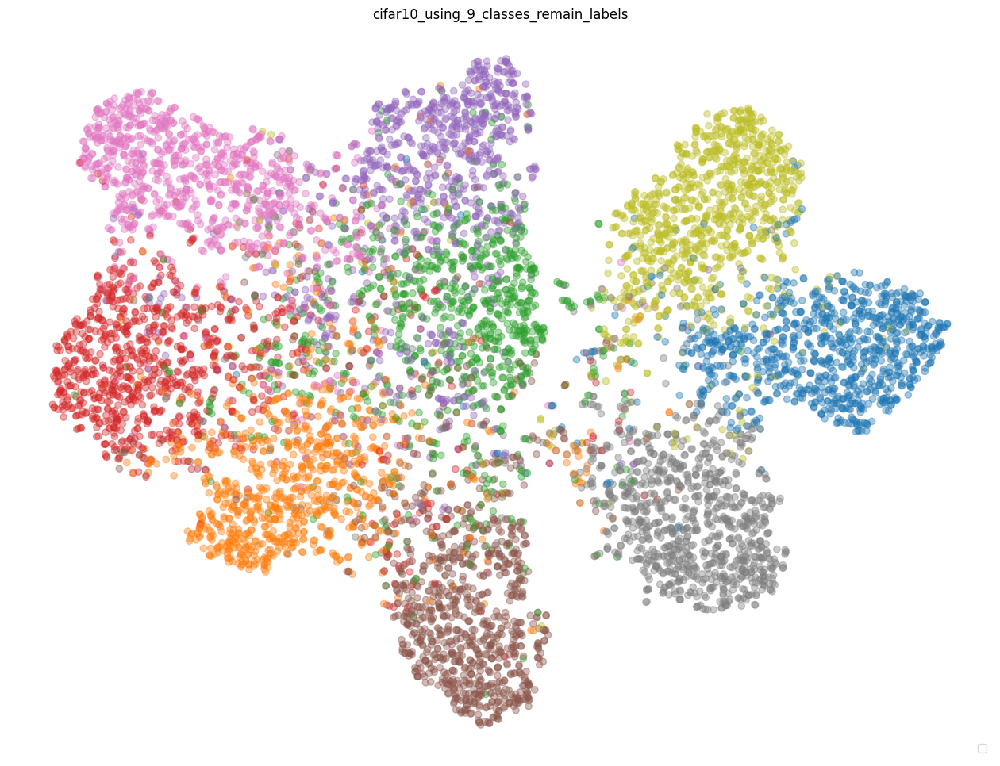

start training epoch  26


100%|██████████| 141/141 [00:05<00:00, 23.86it/s]


[epoch][26 / 30], train_loss : 0.0084, train_accuracy : 99.7022, test_loss : 0.9721, test_accuracy : 84.0000%
start training epoch  27


100%|██████████| 141/141 [00:05<00:00, 23.88it/s]


[epoch][27 / 30], train_loss : 0.0068, train_accuracy : 99.8000, test_loss : 1.0516, test_accuracy : 84.7222%
new acc : 84.72%, save model !
start training epoch  28


100%|██████████| 141/141 [00:05<00:00, 23.92it/s]


[epoch][28 / 30], train_loss : 0.0243, train_accuracy : 99.2356, test_loss : 0.9492, test_accuracy : 84.2889%
start training epoch  29


100%|██████████| 141/141 [00:06<00:00, 21.79it/s]


[epoch][29 / 30], train_loss : 0.0060, train_accuracy : 99.8244, test_loss : 0.9830, test_accuracy : 84.9333%
new acc : 84.93%, save model !
start training epoch  30


100%|██████████| 141/141 [00:05<00:00, 23.55it/s]


[epoch][30 / 30], train_loss : 0.0035, train_accuracy : 99.8867, test_loss : 1.0646, test_accuracy : 84.4333%
visualization decision space 30


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


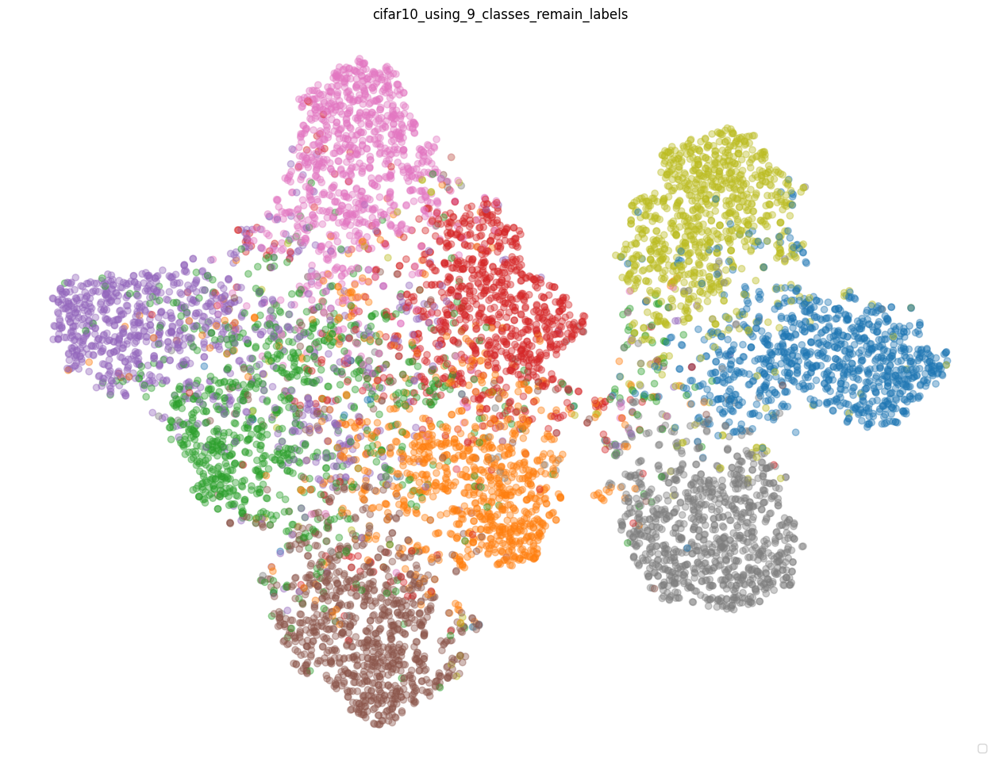

start finetuning


100%|██████████| 79/79 [00:06<00:00, 11.99it/s]


[epoch][1 / 10], fine_tuning_loss: 13.7855, fine_tuning_accruacy: 11.7000


100%|██████████| 79/79 [00:06<00:00, 12.02it/s]


[epoch][2 / 10], fine_tuning_loss: 13.1766, fine_tuning_accruacy: 11.5000


100%|██████████| 79/79 [00:06<00:00, 11.81it/s]


[epoch][3 / 10], fine_tuning_loss: 13.1704, fine_tuning_accruacy: 11.4000


100%|██████████| 79/79 [00:07<00:00, 10.57it/s]


[epoch][4 / 10], fine_tuning_loss: 12.9358, fine_tuning_accruacy: 11.5600


100%|██████████| 79/79 [00:07<00:00, 10.52it/s]


[epoch][5 / 10], fine_tuning_loss: 12.7236, fine_tuning_accruacy: 11.4400


100%|██████████| 79/79 [00:07<00:00, 10.54it/s]


[epoch][6 / 10], fine_tuning_loss: 12.5577, fine_tuning_accruacy: 11.2000


100%|██████████| 79/79 [00:07<00:00, 10.56it/s]


[epoch][7 / 10], fine_tuning_loss: 12.2252, fine_tuning_accruacy: 11.3000


100%|██████████| 79/79 [00:07<00:00, 10.54it/s]


[epoch][8 / 10], fine_tuning_loss: 12.0874, fine_tuning_accruacy: 11.8800


100%|██████████| 79/79 [00:07<00:00, 10.52it/s]


[epoch][9 / 10], fine_tuning_loss: 11.9492, fine_tuning_accruacy: 11.8400


100%|██████████| 79/79 [00:07<00:00, 10.53it/s]


[epoch][10 / 10], fine_tuning_loss: 11.7459, fine_tuning_accruacy: 11.7800
visualization decision space finetuning 10


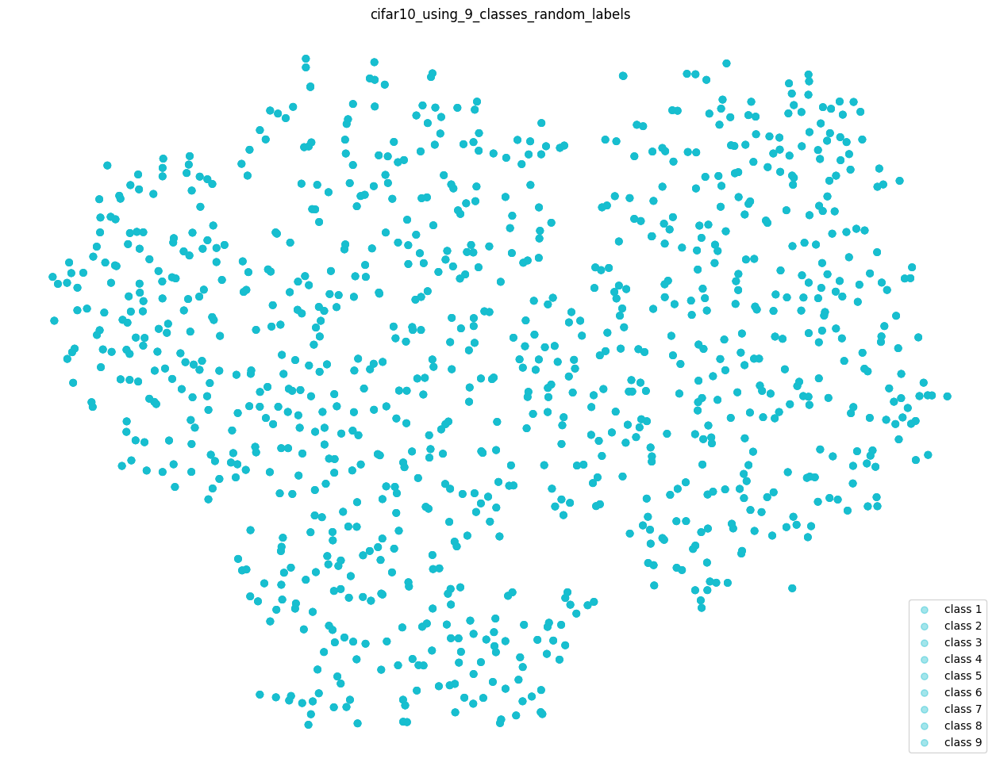

forgetset accuracy after random labels fine_tuning : 9.50%
remainset accuracy after random labels fine_tuning : 78.34%
visualization decision space


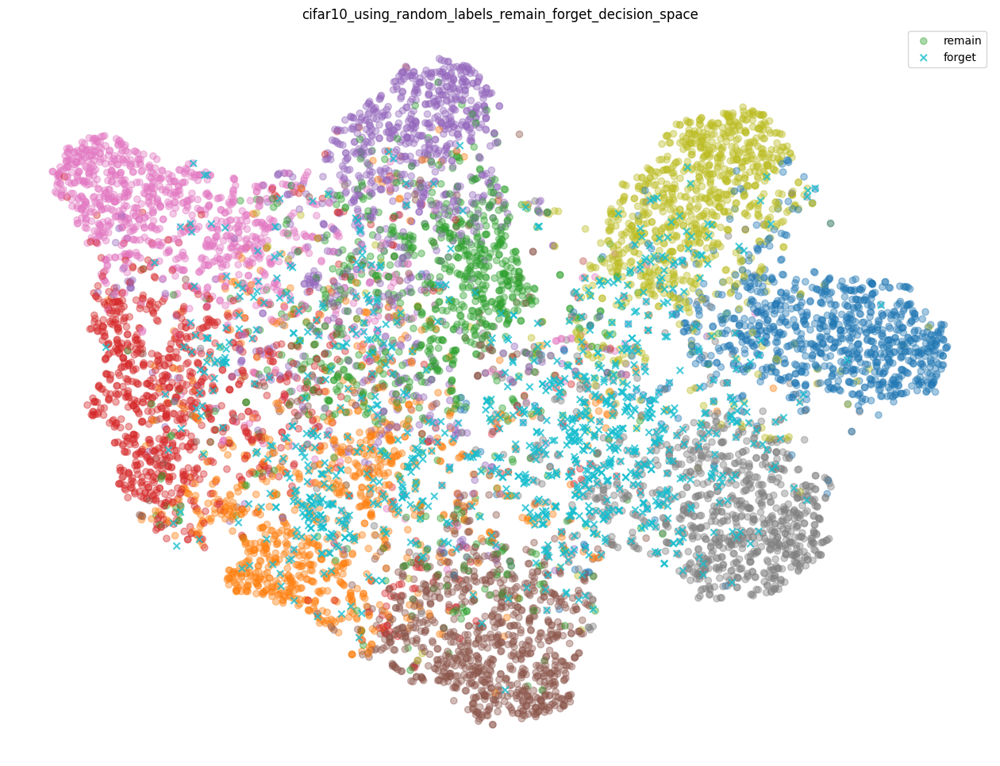

In [26]:
# 모델 선언
model = ResNet18().to(device)

# pt를 저장하기 위한 폴더 생성
pt_folder_name = 'Boundary_Unlearning_task2_pt'
os.makedirs(pt_folder_name, exist_ok = True)

# 모델의 가장 높은 정확도를 기록하기 위한 변수
best_accuracy = 0.

# 분류 문제에서 자주 사용하는 손실 함수
criterion = nn.CrossEntropyLoss()

# Stochastic Gradient Descent = 확률 경사 하강법
optimizer = optim.SGD(model.parameters(), lr = 0.1, momentum = 0.9)

# 학습 30 회
for epoch in range(1, 31):
    print("start training epoch ", epoch)
    
    # 학습 모드 설정, loss, 맞춘 수, 사용한 샘플 수
    model.train()
    train_total_loss = 0.
    train_total_count = 0.
    train_total_data = 0
    
    # 학습 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
    for idx, (images, labels) in enumerate(tqdm(train_remain_loader)):
        # 학습할 device로 보내기 gpu or cpu
        images, labels = images.to(device), labels.to(device)
        
        # 이전 배치에서 계산되 기울기 값 초기화
        optimizer.zero_grad()
        
        # 입력 데이터에 대한 예측
        logit_output = model(images)
        
        # 예측된 출려과 정답 간의 차이 계산
        loss = criterion(logit_output, labels)
        
        # 모델이 예측한 정답
        _, predict = torch.max(logit_output, 1)
        
        # 예측이 실제 정답과 일치하는 수
        check_count = (predict == labels).sum().item()
        
        train_total_loss += loss.item()
        train_total_count += check_count
        train_total_data += len(labels)
        
        # loss에 대한 모델의 가중치의 기울기 계산
        loss.backward()
        # 계산한 기울기를 이용하여 가중치 업데이트
        optimizer.step()
        # 기울기 초기화 후 다음 배치 준비
        model.zero_grad()
        
    # 학습 배치에서의 loss 평균
    train_avg_loss = train_total_loss / len(train_remain_loader)
    # 학습 배치에서의 정확도
    train_accuracy = train_total_count / train_total_data * 100
        
    # 평가 모드 설정, loss, 맞춘 수, 사용한 샘플 수
    model.eval()
    test_total_loss = 0.
    test_total_count = 0.
    test_total_data = 0
    
    # 테스트 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
    for idx, (images, labels) in enumerate(tqdm(test_remain_loader)):
        # 학습할 device로 보내기 gpu or cpu
        images, labels = images.to(device), labels.to(device)
        
        # 기울기 계산을 사용하지 않음
        with torch.no_grad():
            # 테스트 데이터로 모델의 예측값을 얻음
            logit_output = model(images)
            
            # 예측과 정답 사이의 loss 계산
            loss = criterion(logit_output, labels)
            
            # 모델이 예측한 정답을 얻음
            _, predict = torch.max(logit_output, 1)
            
            # 맞춘 샘플 수
            check_count = (predict == labels).sum().item()
            
            test_total_loss += loss.item()
            test_total_count += check_count
            test_total_data += len(labels)
         
    # 테스트 데이터에 대한 loss 평균       
    test_avg_loss = test_total_loss / len(test_remain_loader)
    # 테스트 데이터에 대한 정확도
    test_accuracy = test_total_count / test_total_data * 100
    
    print(f"[epoch][{epoch} / 30], train_loss : {train_avg_loss:.4f}, train_accuracy : {train_accuracy:.4f}, test_loss : {test_avg_loss:.4f}, test_accuracy : {test_accuracy:.4f}%")
    
    # 테스트 데이터가 가장 높은 경우 모델 저장
    if test_accuracy > best_accuracy:
        print(f"new acc : {test_accuracy:.2f}%, save model !")
        best_accuracy = test_accuracy
        # 모델의 가중치를 지정된 경로에 저장
        model_save_path = os.path.join(pt_folder_name, f"resnet18_best_task2.pt")
        torch.save(model.state_dict(), model_save_path)
        
    if epoch == 1 or epoch % 5 == 0:
        print(f'visualization decision space {epoch}')
        remain_embs, remain_labels = extract_emb(model, test_remain_loader, device)
        visualization_emb_random_labels_remain(remain_embs, remain_labels)
        
# random labels를 적용한 데이터를 사용하여 finetuning
print('start finetuning')
optimizer_f = optim.SGD(model.parameters(), lr = 0.00001, momentum = 0.9)

# 학습 모드로 설정
model.train()

# 학습 횟수 10회
for epoch in range(1, 11):
    # loss, 맞춘 수, 샘플 수
    fine_train_loss = 0.0
    fine_total_count = 0
    fine_total_data = 0
    
    # train_forget 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
    for idx, (images, labels) in enumerate(tqdm(train_forget_loader)):
        # 학습할 device로 보내기 gpu or cpu
        images, labels = images.to(device), labels.to(device)
        
        # 이전 배치에서 계산된 기울기 값 초기화
        optimizer_f.zero_grad()
        
        # train_forget 데이터로 모델의 예측값을 얻음
        logit_output = model(images)
        
        # 예측과 정답 사이의 loss 계산
        loss = criterion(logit_output, labels)
        
        # 모델이 예측한 정답을 얻음
        _, fine_predict = torch.max(logit_output, 1)
        
        # 맞춘 샘플 수  
        check_count = (fine_predict == labels).sum().item()
        
        fine_train_loss += loss.item()
        fine_total_count += check_count
        fine_total_data += len(labels)
        
        # loss에 대한 모델의 가중치의 기울기 계산
        loss.backward()
        # 계산한 기울기를 이용하여 가중치 업데이트
        optimizer_f.step()

    # train_forget 데이터에 대한 loss 평균  
    fine_avg_loss = fine_train_loss / len(train_forget_loader)
    
    # train_forget 데이터에 대한 정확도 
    fine_accuracy = fine_total_count / fine_total_data * 100
        
    print(f'[epoch][{epoch} / 10], fine_tuning_loss: {fine_avg_loss:.4f}, fine_tuning_accruacy: {fine_accuracy:.4f}')
    
    if epoch == 10:
        print(f'visualization decision space finetuning {epoch}')
        forget_embs, forget_labels = extract_emb(model, test_forget_loader, device)
        visualization_emb_random_labels_forget(forget_embs, forget_labels)
    
# 평가 모드 설정
model.eval()

# test_forget 데이터에 대한 추론 준비
forget_correct = 0
forget_total_data = 0

# test_forget 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력 
for images, labels in test_forget_loader:
    images, labels = images.to(device), labels.to(device)
    
    # 기울기 계산을 사용하지 않음
    with torch.no_grad():
        # test_forget 데이터로 모델의 예측값을 얻음
        f_test_logit_output = model(images)
        
        # test_forget 데이터로 모델의 예측값을 얻음
        _, f_test_predict = torch.max(f_test_logit_output, 1)
        
        # 맞춘 샘플 수  
        forget_correct += (f_test_predict == labels).sum().item()
        forget_total_data += len(labels)
    
# test_forget 데이터에 대한 정확도 
forget_accuracy = forget_correct / forget_total_data * 100
print(f'forgetset accuracy after random labels fine_tuning : {forget_accuracy:.2f}%')


# test_remain 데이터에 대한 추론 준비
remain_correct = 0
remain_total_data = 0

# test_remain 데이터를 배치 단위로 로드, tqdm으로 진행 상황 출력
for images, labels in test_remain_loader:
    images, labels = images.to(device), labels.to(device)
    
    # 기울기 계산을 사용하지 않음
    with torch.no_grad():
        # test_remain 데이터로 모델의 예측값을 얻음
        r_test_logit_output = model(images)
        
        # test_remain 데이터로 모델의 예측값을 얻음
        _, f_test_predict = torch.max(r_test_logit_output, 1)
        
        # 맞춘 샘플 수
        remain_correct += (f_test_predict == labels).sum().item()
        remain_total_data += len(labels)

# test_remain 데이터에 대한 정확도        
remain_accuracy = remain_correct / remain_total_data * 100
print(f'remainset accuracy after random labels fine_tuning : {remain_accuracy:.2f}%')

# 시각화
print(f'visualization decision space')

remain_embs, remain_labels = extract_emb(model, test_remain_loader, device)
forget_embs, forget_labels = extract_emb(model, test_forget_loader, device)

visualization_emb_com(remain_embs, forget_embs, remain_labels, forget_labels)